In [227]:
import numpy as np
import glob
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.patches import Patch

import matplotlib.font_manager as font_manager
fname = '/Library/Fonts/IBM_Plex_Sans/static/IBMPlexSans-Regular.ttf'  # download IBM Plex Sans
font_manager.fontManager.addfont(fname)
prop = font_manager.FontProperties(fname=fname)
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = prop.get_name()

plt.rcParams.update({
    'font.size': 18,
    'axes.titlesize': 28,
    'axes.labelsize': 18,
    'xtick.labelsize': 18,
    'ytick.labelsize': 18,
    'legend.fontsize': 20,
    'figure.titlesize': 18
})

In [236]:
crop_type_classes = {
        0: "No Data",
        1: "Lucerne/Medics",
        2: "Planted pastures",
        3: "Fallow",
        4: "Wine grapes",
        5: "Weeds",
        6: "Small grain grazing",
        7: "Wheat",
        8: "Canola",
        9: "Rooibos",
    }
burn_scars_classes = {
        # -1: "No Data",
        0: "Not burned",
        1: "Burn Scar",
    }
sen1floods11_classes = {
        # -1: "No Data",
        0: "Not water",
        1: "Water",
    }
cashew_classes = {
        0: "No data", 
        1: "Well-managed plant.",
        2: "Poorly-managed plant.",
        3: "Non-plantation",
        4: "Residential",
        5: "Background",
        6: "Uncertain",
    }
reben_classes = {
        0: "Agro-forestry areas", # "#000000"
        1: "Arable land", # "brown"
        2: "Beaches, dunes, sands", # "#C19368" 
        3: "Broad-leaved forest", # "#198038", old blueish'#33b1ae'
        4: "Coastal wetlands", # '#33618a'
        5: "Cultivation patterns",# '#b24675'
        6: "Coniferous forest", # "darkgreen"
        7: "Industrial/commercial", # "#A56EFF" -> out
        8: "Inland waters",# "#3171AD"
        9: "Inland wetlands",# "#000000"
        10: "Agriculture", # "#9F1853"
        11: "Marine waters", #"#003A6D"
        12: "Mixed forest", # "#009D9A"
        13: "Moors, heathland and sclerophyllous vegetation",# "#000000"
        14: "Grassland", # '#83CA70'
        15: "Pastures",# '#83CA70'  # same as grassland
        16: "Permanent crops", # '#b24675' out
        17: "Transitional woodland, shrub",# "#000000"
        18: "Urban fabric",# "#000000"
    } 
reben_colors = ["#000000", "#a59b8f", "#C19368", "#198038", '#33618a', '#b24675', "#397d49", "#A56EFF", "#3171AD", "#000000", "#9F1853", "#003A6D", "#009D9A", "#000000", '#83CA70', '#83CA70', '#b24675', "#000000", "#000000"]

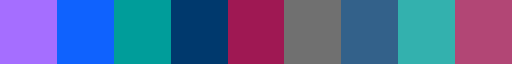

In [121]:
# Purple, Blue, green, dark blue, dark red, gray,  
colors = ["#A56EFF", "#0F62FE", "#009D9A", "#003A6D", "#9F1853", "#707070", '#33618a', '#33b1ae', '#b24675'] 
cm = LinearSegmentedColormap.from_list('cmap', colors, N=len(colors))
cm

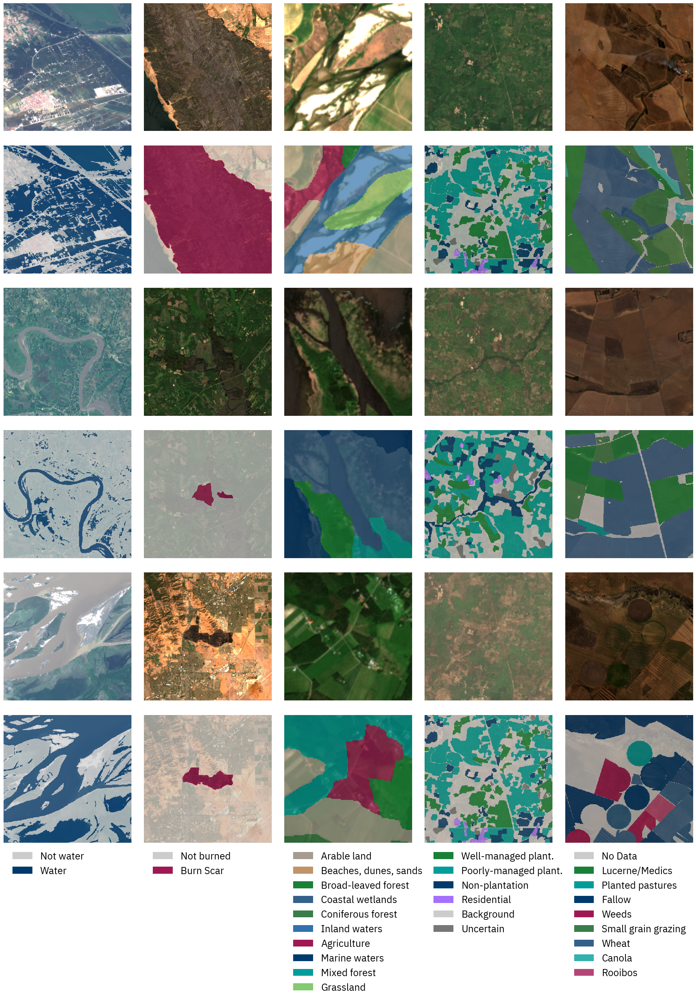

In [241]:
sen1floods11 = glob.glob('../data/preds/sen1floods11/*/')
burn_scars = glob.glob('../data/preds/burn_scars/*/')
cashew = glob.glob('../data/preds/m_cashew_plantation/*/')
crop_type = glob.glob('../data/preds/m_sa_crop_type/*/')
reben = glob.glob('../data/preds/reBEN_7k/*/')

sen1floods11 = np.array(sen1floods11)[[0,2,4]]
burn_scars = np.array(burn_scars)[[1,2,3]]
reben = np.array(reben)[[1,2,4]]
cashew = np.array(cashew)[[0,2,3]]
crop_type = np.array(crop_type)[[0,2,3]]

legend_height = 0.02
n_samples = 3
fig, ax = plt.subplots(ncols=5, nrows=n_samples*2, figsize=(20, 8*n_samples), )
fig.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.1, hspace=0.1)

sen1floods11_labels = []
burn_scars_labels = []
reben_labels = []
cashew_labels = []
crop_labels = []

for i in range(n_samples):
    # Sen1Floods11    
    rgb = np.load(sen1floods11[i] + 'npy_rgb.npy')
    rgb = (rgb / 2000).clip(0, 1)
    ax[i*2][0].imshow(rgb)
    label = np.load(sen1floods11[i] + 'npy_label.npy')
    sen1floods11_labels.append(label)
    colors = ["#CCCCCC", "#003A6D"]
    cm = LinearSegmentedColormap.from_list('cmap', colors, N=len(colors))
    ax[i*2+1][0].imshow(rgb)
    ax[i*2+1][0].imshow(label, cmap=cm, interpolation='nearest', vmin=0, vmax=len(colors)-1, alpha=0.7)
    ax[i*2][0].axis('off')
    ax[i*2+1][0].axis('off')
    
    if i == n_samples - 1:
        legend_handles = [Patch(facecolor=colors[i], label=name) for i, (c, name) in enumerate(sen1floods11_classes.items()) if c in np.stack(sen1floods11_labels)]  
        pos = ax[-1][0].get_position()
        floods_legend = fig.add_axes([pos.x0, pos.y0 - legend_height, pos.width, legend_height])
        floods_legend.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(0, 1), loc='upper left')
        floods_legend.axis('off')
            
    # Burn Scars    
    rgb = np.load(burn_scars[i] + 'npy_rgb.npy')
    rgb = (rgb / 0.2).clip(0, 1)
    ax[i*2][1].imshow(rgb)
    label = np.load(burn_scars[i] + 'npy_label.npy')
    burn_scars_labels.append(label)
    colors = ["#CCCCCC", "#9F1853"]
    cm = LinearSegmentedColormap.from_list('cmap', colors, N=len(colors))
    ax[i*2+1][1].imshow(rgb)
    ax[i*2+1][1].imshow(label, cmap=cm, interpolation='nearest', vmin=0, vmax=len(colors)-1, alpha=0.7)
    ax[i*2][1].axis('off')
    ax[i*2+1][1].axis('off')

    if i == n_samples - 1:
        legend_handles = [Patch(facecolor=colors[i], label=name) for i, (c, name) in enumerate(burn_scars_classes.items()) if c in np.stack(burn_scars_labels)]  
        pos = ax[-1][1].get_position()
        burn_legend = fig.add_axes([pos.x0, pos.y0 - legend_height, pos.width, legend_height])
        burn_legend.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(0, 1), loc='upper left')
        burn_legend.axis('off')
    
    # reBEN    
    rgb = np.load(reben[i] + 'npy_rgb.npy')
    rgb = (rgb / 2000).clip(0, 1)
    ax[i*2][2].imshow(rgb)
    label = np.load(reben[i] + 'npy_label.npy')
    reben_labels.append(label)
    colors = ["#000000", "#a59b8f", "#C19368", "#198038", '#33618a', "#000000", "#397d49", "#A56EFF", "#3171AD", "#000000", "#9F1853", "#003A6D", "#009D9A", "#000000", '#83CA70', "#000000", '#b24675', "#000000", "#000000"]
    cm = LinearSegmentedColormap.from_list('cmap', colors, N=len(colors))
    ax[i*2+1][2].imshow(rgb)
    ax[i*2+1][2].imshow(label, cmap=cm, interpolation='nearest', vmin=0, vmax=len(colors)-1, alpha=0.7)
    ax[i*2][2].axis('off')
    ax[i*2+1][2].axis('off')
    
    if i == n_samples - 1:
        legend_handles = [Patch(facecolor=colors[i], label=name) for i, (c, name) in enumerate(reben_classes.items()) if c in np.stack(reben_labels)]  
        pos = ax[-1][2].get_position()
        reben_legend = fig.add_axes([pos.x0, pos.y0 - legend_height, pos.width, legend_height])
        reben_legend.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(0, 1), loc='upper left')
        reben_legend.axis('off')
    
    # Cashew
    rgb = np.load(cashew[i] + 'npy_rgb.npy')
    rgb = (rgb / 2000).clip(0, 1)
    ax[i*2][3].imshow(rgb)
    label = np.load(cashew[i] + 'npy_label.npy')
    cashew_labels.append(label)
    colors = ["#000000", "#198038", "#009D9A", "#003A6D", "#A56EFF", "#CCCCCC", "#777777"]
    cm = LinearSegmentedColormap.from_list('cmap', colors, N=len(colors))
    ax[i*2+1][3].imshow(rgb)
    ax[i*2+1][3].imshow(label, cmap=cm, interpolation='nearest', vmin=0, vmax=len(colors)-1, alpha=0.7)
    ax[i*2][3].axis('off')
    ax[i*2+1][3].axis('off')
    
    if i == n_samples - 1:
        legend_handles = [Patch(facecolor=colors[i], label=name) for i, (c, name) in enumerate(cashew_classes.items()) if c in np.stack(cashew_labels)]  
        pos = ax[-1][3].get_position()
        cashew_legend = fig.add_axes([pos.x0, pos.y0 - legend_height, pos.width, legend_height])
        cashew_legend.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(0, 1), loc='upper left')
        cashew_legend.axis('off')
        
    # Crop    
    rgb = np.load(crop_type[i] + 'rgb.npy')
    rgb = (rgb / 150).clip(0, 1)
    ax[i*2][4].imshow(rgb)
    label = np.load(crop_type[i] + 'npy_label.npy')
    crop_labels.append(label)
    colors = ["#CCCCCC", "#198038", "#009D9A", "#003A6D", "#0F62FE", "#9F1853", "#397d49", '#33618a', '#33b1ae', '#b24675']
    cm = LinearSegmentedColormap.from_list('cmap', colors, N=len(colors))
    ax[i*2+1][4].imshow(rgb)
    ax[i*2+1][4].imshow(label, cmap=cm, interpolation='nearest', vmin=0, vmax=len(colors)-1, alpha=0.7)
    ax[i*2][4].axis('off')
    ax[i*2+1][4].axis('off')
    
    if i == n_samples - 1:
        legend_handles = [Patch(facecolor=colors[i], label=name) for i, (c, name) in enumerate(crop_type_classes.items()) if c in np.stack(crop_labels)]  
        pos = ax[-1][4].get_position()
        crop_legend = fig.add_axes([pos.x0, pos.y0 - legend_height, pos.width, legend_height])
        crop_legend.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(0, 1), loc='upper left')
        crop_legend.axis('off')
        
plt.savefig('../assets/dataset_examples.pdf', pad_inches=0, bbox_inches='tight')    
plt.show()

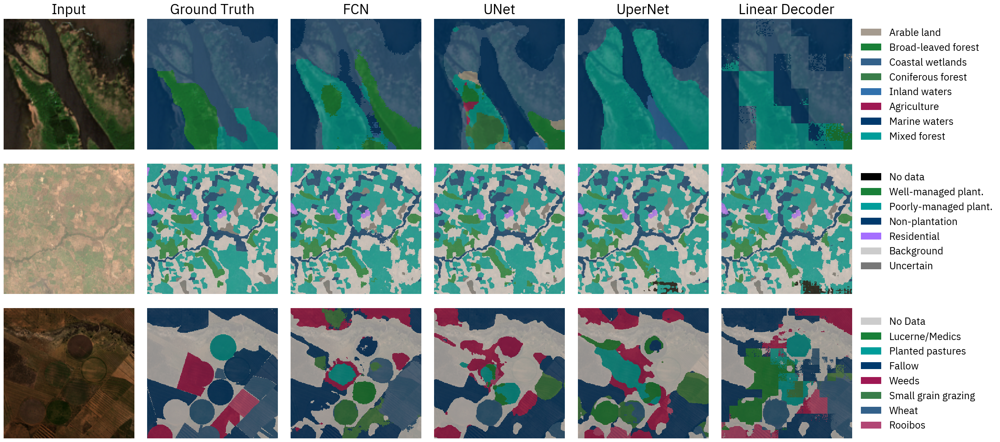

In [239]:

legend_height = 0.02
decoder = {
    'label': 'Ground Truth', 
    'fcn': 'FCN', 
    'unet': 'UNet', 
    'upernet': 'UperNet', 
    'linear_decoder': 'Linear Decoder'
}

sen1floods11 = glob.glob('../data/preds/sen1floods11/*/')
burn_scars = glob.glob('../data/preds/burn_scars/*/')
cashew = glob.glob('../data/preds/m_cashew_plantation/*/')
crop_type = glob.glob('../data/preds/m_sa_crop_type/*/')
reben = glob.glob('../data/preds/reBEN_7k/*/')

floods_example = sen1floods11[3] # cool: 3
burn_example = burn_scars[2]  # nice: maybe 0?, 2 challenging.
reben_example = reben[2]  # patchy: 2, 3
cashew_example = cashew[1] # patchy: 1
crop_example = crop_type[3] # patchy: 3

# Sen1Floods11    
floods_rgb = np.load(floods_example + 'npy_rgb.npy')
floods_rgb = (floods_rgb / 2000).clip(0, 1)
floods_colors = ["#CCCCCC", "#003A6D"]

# Burn Scars   
burn_rgb = np.load(burn_example + 'npy_rgb.npy')
burn_rgb = (burn_rgb / 0.2).clip(0, 1)
burn_colors = ["#CCCCCC", "#9F1853"]

# reBEN
reben_rgb = np.load(reben_example + 'npy_rgb.npy')
reben_rgb = (reben_rgb / 2000).clip(0, 1)
reben_colors = ["#000000", "#a59b8f", "#C19368", "#198038", '#33618a', "#000000", "#397d49", "#A56EFF", "#3171AD", "#000000", "#9F1853", "#003A6D", "#009D9A", "#000000", '#83CA70', "#000000", '#b24675', "#000000", "#000000"]

# Cashew   
cashew_rgb = np.load(cashew_example + 'npy_rgb.npy')
cashew_rgb = (cashew_rgb / 2000).clip(0, 1)
cashew_colors = ["#000000", "#198038", "#009D9A", "#003A6D", "#A56EFF", "#CCCCCC", "#777777"]

# Crop   
crop_rgb = np.load(crop_example + 'rgb.npy')
crop_rgb = (crop_rgb / 150).clip(0, 1)
crop_colors = ["#CCCCCC", "#198038", "#009D9A", "#003A6D", "#0F62FE", "#9F1853", "#397d49", '#33618a', '#33b1ae', '#b24675']

n_samples = 3
fig, ax = plt.subplots(ncols=6, nrows=n_samples, figsize=(4*6, 4*n_samples))
fig.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.1, hspace=0.1)

for row, (rgb, colors, example, classes) in enumerate([
    # (floods_rgb, floods_colors, floods_example, sen1floods11_classes),
    # (burn_rgb, burn_colors, burn_example, burn_scars_classes),
    (reben_rgb, reben_colors, reben_example, reben_classes),
    (cashew_rgb, cashew_colors, cashew_example, cashew_classes),
    (crop_rgb, crop_colors, crop_example, crop_type_classes),
]):
    ax[row][0].imshow(rgb)
    ax[row][0].axis('off')

    row_labels = []
    label = np.load(example + f'npy_label.npy')
    size = label.shape

    for i, dec in enumerate(['label', 'fcn', 'unet', 'upernet', 'linear_decoder']):
        label = np.load(example + f'npy_{dec}.npy')
        label = label[:size[0], :size[1]]
        row_labels.append(label.flatten())
        cm = LinearSegmentedColormap.from_list('cmap', colors, N=len(colors))
        ax[row][i+1].imshow(rgb)
        ax[row][i+1].imshow(label, cmap=cm, interpolation='nearest', vmin=0, vmax=len(colors)-1, alpha=0.7)
        ax[row][i+1].axis('off')
        
    legend_handles = [Patch(facecolor=colors[i], label=name) for i, (c, name) in enumerate(classes.items()) if (np.concatenate(row_labels) == c).sum() > 100]  
    pos = ax[row][-1].get_position()
    floods_legend = fig.add_axes([pos.x1, pos.y1 - legend_height, pos.width, legend_height])
    floods_legend.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(0, 1), loc='upper left')
    floods_legend.axis('off')

# Add title
ax[0][0].set_title("Input", pad=10)
for i, dec in enumerate(['label', 'fcn', 'unet', 'upernet', 'linear_decoder']):
    ax[0][i+1].set_title(decoder[dec], pad=10)

plt.savefig('../assets/predictions_patchy.pdf', pad_inches=0, bbox_inches='tight')
plt.show()

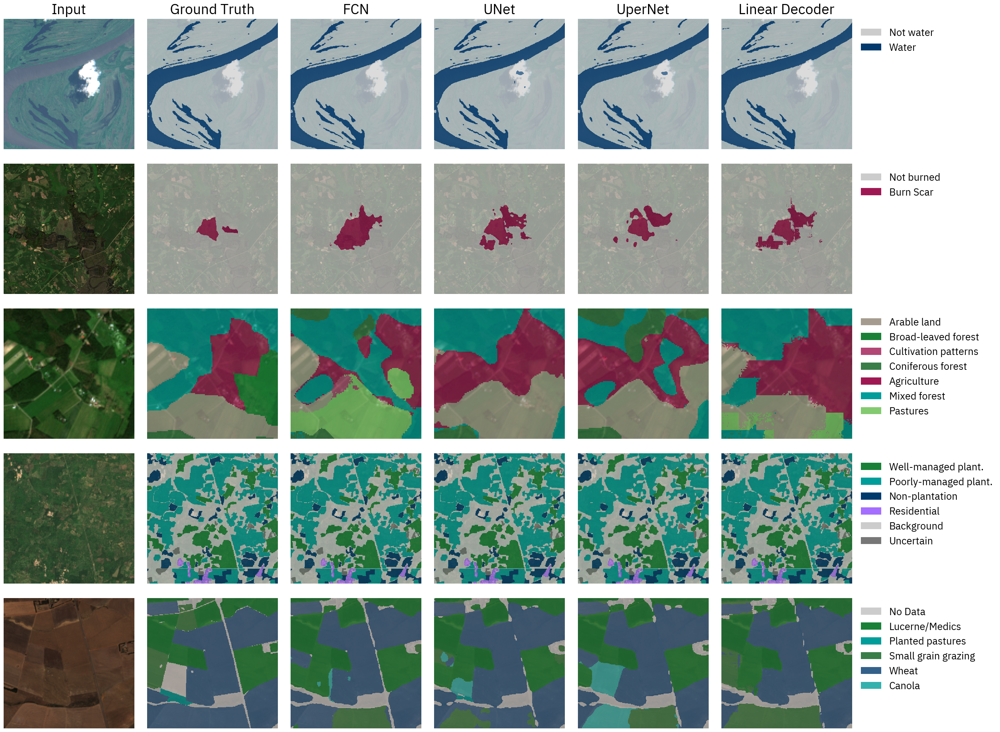

In [238]:

legend_height = 0.02
decoder = {
    'label': 'Ground Truth', 
    'fcn': 'FCN', 
    'unet': 'UNet', 
    'upernet': 'UperNet', 
    'linear_decoder': 'Linear Decoder'
}

sen1floods11 = glob.glob('../data/preds/sen1floods11/*/')
burn_scars = glob.glob('../data/preds/burn_scars/*/')
cashew = glob.glob('../data/preds/m_cashew_plantation/*/')
crop_type = glob.glob('../data/preds/m_sa_crop_type/*/')
reben = glob.glob('../data/preds/reBEN_7k/*/')

floods_example = sen1floods11[3] # cool: 3
burn_example = burn_scars[2]  # nice: maybe 0?, 2 challenging.
reben_example = reben[4]  # patchy: 2, 3
cashew_example = cashew[0] # patchy: 1
crop_example = crop_type[2] # patchy: 3

# Sen1Floods11    
floods_rgb = np.load(floods_example + 'npy_rgb.npy')
floods_rgb = (floods_rgb / 2000).clip(0, 1)
floods_colors = ["#CCCCCC", "#003A6D"]

# Burn Scars   
burn_rgb = np.load(burn_example + 'npy_rgb.npy')
burn_rgb = (burn_rgb / 0.2).clip(0, 1)
burn_colors = ["#CCCCCC", "#9F1853"]

# reBEN
reben_rgb = np.load(reben_example + 'npy_rgb.npy')
reben_rgb = (reben_rgb / 2000).clip(0, 1)

# Cashew   
cashew_rgb = np.load(cashew_example + 'npy_rgb.npy')
cashew_rgb = (cashew_rgb / 2000).clip(0, 1)
cashew_colors = ["#000000", "#198038", "#009D9A", "#003A6D", "#A56EFF", "#CCCCCC", "#777777"]

# Crop   
crop_rgb = np.load(crop_example + 'rgb.npy')
crop_rgb = (crop_rgb / 150).clip(0, 1)
crop_colors = ["#CCCCCC", "#198038", "#009D9A", "#003A6D", "#0F62FE", "#9F1853", "#397d49", '#33618a', '#33b1ae', '#b24675']

n_samples = 5
fig, ax = plt.subplots(ncols=6, nrows=n_samples, figsize=(4*6, 4*n_samples))
fig.tight_layout(pad=0)
fig.subplots_adjust(wspace=0.1, hspace=0.1)

for row, (rgb, colors, example, classes) in enumerate([
    (floods_rgb, floods_colors, floods_example, sen1floods11_classes),
    (burn_rgb, burn_colors, burn_example, burn_scars_classes),
    (reben_rgb, reben_colors, reben_example, reben_classes),
    (cashew_rgb, cashew_colors, cashew_example, cashew_classes),
    (crop_rgb, crop_colors, crop_example, crop_type_classes),
]):
    ax[row][0].imshow(rgb)
    ax[row][0].axis('off')

    row_labels = []
    label = np.load(example + f'npy_label.npy')
    size = label.shape

    for i, dec in enumerate(['label', 'fcn', 'unet', 'upernet', 'linear_decoder']):
        label = np.load(example + f'npy_{dec}.npy')
        label = label[:size[0], :size[1]]
        row_labels.append(label.flatten())
        cm = LinearSegmentedColormap.from_list('cmap', colors, N=len(colors))
        ax[row][i+1].imshow(rgb)
        ax[row][i+1].imshow(label, cmap=cm, interpolation='nearest', vmin=0, vmax=len(colors)-1, alpha=0.7)
        ax[row][i+1].axis('off')
        
    legend_handles = [Patch(facecolor=colors[i], label=name) for i, (c, name) in enumerate(classes.items()) if (np.concatenate(row_labels) == c).sum() > 100]  
    pos = ax[row][-1].get_position()
    floods_legend = fig.add_axes([pos.x1, pos.y1 - legend_height, pos.width, legend_height])
    floods_legend.legend(handles=legend_handles, frameon=False, bbox_to_anchor=(0, 1), loc='upper left')
    floods_legend.axis('off')

# Add title
ax[0][0].set_title("Input", pad=10)
for i, dec in enumerate(['label', 'fcn', 'unet', 'upernet', 'linear_decoder']):
    ax[0][i+1].set_title(decoder[dec], pad=10)

plt.savefig('../assets/predictions_all.pdf', pad_inches=0, bbox_inches='tight')
plt.show()